## Tanzanian Water Wells Status Prediction


By: Ahmet KARAOGLAN

## Overview
Tanzania is a developing country that struggles to get clean water to its population of 59 million people. According to WHO, 1 in 6 people in Tanzania lack access to safe drinking water and 29 million don't have access to improved sanitation. The focus of this project is to build a classification model to predict the functionality of waterpoints in Tanzania given data provided by Taarifa and the Tanzanian Ministry of Water. The model was built from a dataset containing information about the source of water and status of the waterpoint (functional, functional but needs repairs, and non functional) using an iterative approach and can be found here. The dataset contains 60,000 waterpoints in Tanzania and the following features:

## Business Problem
The Tanzanian government has a severe water crisis on their hands as a result of the vast number of non functional wells and they have asked for help. They want to be able to predict the statuses of which pumps are functional, functional but need repair, and non functional in order to improve their maintenance operations and ensure that it's residents have access to safe drinking water. The data has been collected by and is provided by Taarifa and the Tanzanian Ministry of Water with the hope that the information provided by each waterpoint can aid understanding in which waterpoints will fail.

I have partnered with the Tanzanian government to build a classification model to predict the status of the waterpoints using the dataset provided. I will use the precision of the functional wells as my main metric for model selection, as a non functional well being predicted as a functional well would be more detrimental to their case, but will provide and discuss several metrics for each model.

## Data Understanding
The dataset used for this analysis can be found here. It contains a wealth of information about waterpoints in Tanzania and the status of their operation. The target variable has 3 different options for it's status:

- functional - the waterpoint is operational and there are no repairs needed
- functional needs repair - the waterpoint is operational, but needs repairs
- non functional - the waterpoint is not operational
Below I will import the dataset and start my investigation of relevant information it may contain. Let's get started!

In [74]:
# Import standard packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE, SMOTENC

# Classification Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from sklearn.dummy import DummyClassifier
from xgboost.sklearn import XGBClassifier

from sklearn.metrics import plot_confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score

# Scalers
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, label_binarize

# Categorical Create Dummies
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import ExtraTreesClassifier




In [75]:
# Data Import Train Set
df_train_set = pd.read_csv('training_set_values.csv', index_col='id')
df_train_set



,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
id,,,,,,,,,,,,,,,,,,,,,
69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,Pangani,...,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
27263,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,Rufiji,...,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe
37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,0,Rufiji,...,monthly,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump


In [76]:
# Data import Training set labels
df_train_labels = pd.read_csv('training_set_labels.csv', index_col='id')
df_train_labels

,status_group
id,
69572,functional
8776,functional
34310,functional
67743,non functional
19728,functional
...,...
60739,functional
27263,functional
37057,functional


In [77]:
#Merge datasets
df = pd.merge(df_train_labels, df_train_set, how = 'inner', on='id')

In [78]:
#Reset index
df.reset_index(inplace=True)
df.head()

,id,status_group,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,functional,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,functional,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,functional,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,non functional,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,functional,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [79]:
df['permit']

0        False
1         True
2         True
3         True
4         True
         ...  
59395     True
59396     True
59397    False
59398     True
59399     True
Name: permit, Length: 59400, dtype: object

In [80]:
# Check datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   status_group           59400 non-null  object 
 2   amount_tsh             59400 non-null  float64
 3   date_recorded          59400 non-null  object 
 4   funder                 55765 non-null  object 
 5   gps_height             59400 non-null  int64  
 6   installer              55745 non-null  object 
 7   longitude              59400 non-null  float64
 8   latitude               59400 non-null  float64
 9   wpt_name               59400 non-null  object 
 10  num_private            59400 non-null  int64  
 11  basin                  59400 non-null  object 
 12  subvillage             59029 non-null  object 
 13  region                 59400 non-null  object 
 14  region_code            59400 non-null  int64  
 15  di

In [81]:
#Get stats on numeric columns
df.describe()


,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [82]:
#Check for duplicates
sum(df.duplicated())

0

In [83]:
# Print all value counts to make observations
for col in df.columns:
    print(df[col].value_counts())


69572    1
27851    1
6924     1
61097    1
48517    1
        ..
59036    1
56446    1
3855     1
52786    1
26348    1
Name: id, Length: 59400, dtype: int64
functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64
0.0         41639
500.0        3102
50.0         2472
1000.0       1488
20.0         1463
            ...  
6300.0          1
120000.0        1
138000.0        1
350000.0        1
59.0            1
Name: amount_tsh, Length: 98, dtype: int64
2011-03-15    572
2011-03-17    558
2013-02-03    546
2011-03-14    520
2011-03-16    513
             ... 
2011-09-11      1
2011-08-31      1
2011-09-21      1
2011-08-30      1
2013-12-01      1
Name: date_recorded, Length: 356, dtype: int64
Government Of Tanzania    9084
Danida                    3114
Hesawa                    2202
Rwssp                     1374
World Bank                1349
                          ... 
Rarymond Ekura               1
Justin

In [84]:
# Check null values
df.isna().sum()

id                           0
status_group                 0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_qu

In [85]:
# Check unique values for categorical data
obj_df = df.select_dtypes(include=['object'])
obj_df.nunique()

status_group                 3
date_recorded              356
funder                    1897
installer                 2145
wpt_name                 37400
basin                        9
subvillage               19287
region                      21
lga                        125
ward                      2092
public_meeting               2
recorded_by                  1
scheme_management           12
scheme_name               2696
permit                       2
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_group                6
quantity                     5
quantity_group               5
source                      10
source_type                  7
source_class                 3
waterpoint_type              7
waterpoint_type_group        6
dtype: int64

# Initial Observations
## Missing Values
scheme_name has the most missing values, followed by funder, installer, public_meeting, scheme_management, and permit with ~3,000 null values, and then subvillage with 371 null values. Several of these columns will be deleted as they appear to duplicate other columns, and I will investigate installer, permit, and subvillage further.

## Data types
wpt_name, subvillage, ward, scheme_name, installer, funder, and date_recorded are categorical features that have unique values in the thousands. This will be a problem with dummy variables, will likely remove or feature engineer.
I will drop recorded_by as it has the same value for all rows.
num_private is not defined on the DrivenData site, and it is not obvious what the feature indicates.
id column will be dropped.
public_meeting and permit are boolean.
construction_year, latitude, longitude, gps_height, amount_tsh, and population all have thousands of rows of 0 entered. I will drop rows for most of these variables that have 0 entered, and will have to investigate further for real data on some columns.

### Duplicate and Similar Data
The following columns all contain duplicate or similar data, will remove features that will cause multicollinearity:

- extraction_type, extraction_type_group, and extraction_type_class
- payment and payment_type
- water_quality and quality_group
- quanitity and quantity_group
- source and source_type
- waterpoint_type and waterpoint_type_group
- region and region_code
### Data Cleaning
In this section, I will clean the dataset by removing similar and unnecessary columns and trim the dataset of remaining null values. I will also further investigate whether some columns contain the same information if it was not immediately obvious. There are several rows containing 0 enteries in some column information. I will investigate whether I believe the data to be real instead of a placeholder.

### Drop duplicate and columns with similar information
I will keep extraction_type_class and remove extraction_type and extraction_type_group as it's columns values appear to be the most relevant for the project. scheme_name will be dropped for it's many null values. Other columns will be removed at this point due to irrelavancy, duplicates, null values, and some others will have to be investigated after the first drop.

In [86]:
# Columns to be dropped
dropped_columns = ['extraction_type', 'extraction_type_group', 'payment', 'scheme_name', 'quality_group',
                   'quantity_group', 'source', 'waterpoint_type_group', 'recorded_by', 'num_private', 
                   'id', 'subvillage', 'wpt_name', 'ward', 'funder', 'date_recorded', 'public_meeting', 
                   'region_code', 'district_code', 'lga', 'scheme_management', 'source_class']

In [87]:
df = df.drop(dropped_columns, axis=1)


In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   status_group           59400 non-null  object 
 1   amount_tsh             59400 non-null  float64
 2   gps_height             59400 non-null  int64  
 3   installer              55745 non-null  object 
 4   longitude              59400 non-null  float64
 5   latitude               59400 non-null  float64
 6   basin                  59400 non-null  object 
 7   region                 59400 non-null  object 
 8   population             59400 non-null  int64  
 9   permit                 56344 non-null  object 
 10  construction_year      59400 non-null  int64  
 11  extraction_type_class  59400 non-null  object 
 12  management             59400 non-null  object 
 13  management_group       59400 non-null  object 
 14  payment_type           59400 non-null  object 
 15  wa

### Dealing with null values


In [89]:
#Check for nulls
df.isna().sum()

status_group                0
amount_tsh                  0
gps_height                  0
installer                3655
longitude                   0
latitude                    0
basin                       0
region                      0
population                  0
permit                   3056
construction_year           0
extraction_type_class       0
management                  0
management_group            0
payment_type                0
water_quality               0
quantity                    0
source_type                 0
waterpoint_type             0
dtype: int64

In [90]:
# Drop all remaining null values from our dataset
df = df.dropna()

In [91]:
#Check to see that it worked
df.isna().sum()

status_group             0
amount_tsh               0
gps_height               0
installer                0
longitude                0
latitude                 0
basin                    0
region                   0
population               0
permit                   0
construction_year        0
extraction_type_class    0
management               0
management_group         0
payment_type             0
water_quality            0
quantity                 0
source_type              0
waterpoint_type          0
dtype: int64

In [92]:
# Convert boolean permit to integers
df['permit'] = df['permit'].astype(int)


In [93]:
# Check to see that it worked
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55102 entries, 0 to 59399
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   status_group           55102 non-null  object 
 1   amount_tsh             55102 non-null  float64
 2   gps_height             55102 non-null  int64  
 3   installer              55102 non-null  object 
 4   longitude              55102 non-null  float64
 5   latitude               55102 non-null  float64
 6   basin                  55102 non-null  object 
 7   region                 55102 non-null  object 
 8   population             55102 non-null  int64  
 9   permit                 55102 non-null  int64  
 10  construction_year      55102 non-null  int64  
 11  extraction_type_class  55102 non-null  object 
 12  management             55102 non-null  object 
 13  management_group       55102 non-null  object 
 14  payment_type           55102 non-null  object 
 15  wa

### Investigate management and management_group
I need to investigate these 2 columns further to see if they contain similar information.

In [94]:
df['management'].value_counts()


vwc                 37416
wug                  6314
water board          2705
wua                  2307
private operator     1891
parastatal           1588
water authority       825
other                 733
company               656
unknown               491
other - school         99
trust                  77
Name: management, dtype: int64

In [95]:
df['management_group'].value_counts()


user-group    48742
commercial     3449
parastatal     1588
other           832
unknown         491
Name: management_group, dtype: int64

The most data is contained in the user-group subcategory of management_group. I will groupby to investigate if the information is similar.

In [96]:
df.loc[df['management_group']=='user-group']['management'].value_counts()


vwc            37416
wug             6314
water board     2705
wua             2307
Name: management, dtype: int64

The data is identical to the data contained in the management column in the subcategory of 'user-group'. I will drop management_group from our features.

In [97]:
#Drop column
df = df.drop('management_group', axis=1)

In [98]:
#Check to see that it worked
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55102 entries, 0 to 59399
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   status_group           55102 non-null  object 
 1   amount_tsh             55102 non-null  float64
 2   gps_height             55102 non-null  int64  
 3   installer              55102 non-null  object 
 4   longitude              55102 non-null  float64
 5   latitude               55102 non-null  float64
 6   basin                  55102 non-null  object 
 7   region                 55102 non-null  object 
 8   population             55102 non-null  int64  
 9   permit                 55102 non-null  int64  
 10  construction_year      55102 non-null  int64  
 11  extraction_type_class  55102 non-null  object 
 12  management             55102 non-null  object 
 13  payment_type           55102 non-null  object 
 14  water_quality          55102 non-null  object 
 15  qu

In [99]:
for col in df.columns:
    print(df[col].value_counts())

functional                 29885
non functional             21381
functional needs repair     3836
Name: status_group, dtype: int64
0.0         37811
500.0        3071
50.0         2333
1000.0       1442
20.0         1427
            ...  
53.0            1
138000.0        1
306.0           1
6300.0          1
59.0            1
Name: amount_tsh, Length: 95, dtype: int64
 0       18310
-15         54
-16         51
 303        51
-13         50
         ...  
 2401        1
 2299        1
 2623        1
 2627        1
 2366        1
Name: gps_height, Length: 2426, dtype: int64
DWE              17361
Government        1788
RWE               1203
Commu             1060
DANIDA            1049
                 ...  
B.A.P                1
R                    1
Nasan workers        1
TWESS                1
SELEPTA              1
Name: installer, Length: 2056, dtype: int64
0.000000     1793
33.005032       2
32.924886       2
32.993683       2
36.802490       2
             ... 
32.904856   

After our first round of cleaning, there are several features we need to examine further:

- status_group is an unbalanced target, may need to look into further during modeling and apply SMOTE.
- There are several columns with thousands of 0 entries - amount_tsh, gps_height, longitude, latitude, population, construction_year.


### Construction year


In [100]:
df['construction_year'].value_counts()


0       18392
2008     2568
2009     2490
2010     2427
2000     1565
2007     1557
2006     1447
2003     1276
2011     1211
2004     1107
2002     1064
1978     1027
2012     1025
2005      983
1995      978
1999      950
1985      941
1998      921
1984      777
1996      766
1982      741
1972      705
1994      703
1974      675
1990      666
1980      647
1992      632
1997      612
1993      595
2001      530
1988      520
1983      487
1975      437
1986      431
1976      411
1991      322
1989      316
1970      310
1987      297
1981      237
1977      199
1979      192
1973      183
2013      173
1971      145
1963       84
1967       83
1968       68
1969       59
1960       45
1964       40
1962       29
1961       20
1965       19
1966       17
Name: construction_year, dtype: int64

In [101]:
# Finding mean and median without zero values
df.loc[df['construction_year']!=0].describe()

,amount_tsh,gps_height,longitude,latitude,population,permit,construction_year
count,36710.000000,36710.000000,36710.000000,36710.000000,36710.000000,36710.000000,36710.000000
mean,471.881843,982.395015,36.015003,-6.358975,268.881694,0.717379,1996.888096
std,3074.841656,623.784917,2.609370,2.762486,542.812926,0.450280,12.452883
min,0.000000,-63.000000,29.607122,-11.649440,0.000000,0.000000,1960.000000
25%,0.000000,351.000000,34.671850,-8.855908,30.000000,0.000000,1987.000000
50%,0.000000,1116.500000,36.691907,-6.351197,150.000000,1.000000,2000.000000
75%,200.000000,1471.000000,37.896261,-3.731978,304.000000,1.000000,2008.000000
max,250000.000000,2770.000000,40.345193,-1.042375,30500.000000,1.000000,2013.000000


In [102]:
#Replace 0 values in construction_year with 1950 to aid visualization
df['construction_year'].replace(to_replace = 0, value = 1950, inplace=True)

In [103]:
#Check to see if it worked
df['construction_year'].value_counts()

1950    18392
2008     2568
2009     2490
2010     2427
2000     1565
2007     1557
2006     1447
2003     1276
2011     1211
2004     1107
2002     1064
1978     1027
2012     1025
2005      983
1995      978
1999      950
1985      941
1998      921
1984      777
1996      766
1982      741
1972      705
1994      703
1974      675
1990      666
1980      647
1992      632
1997      612
1993      595
2001      530
1988      520
1983      487
1975      437
1986      431
1976      411
1991      322
1989      316
1970      310
1987      297
1981      237
1977      199
1979      192
1973      183
2013      173
1971      145
1963       84
1967       83
1968       68
1969       59
1960       45
1964       40
1962       29
1961       20
1965       19
1966       17
Name: construction_year, dtype: int64

It is unfortunate that there are 19,000 entries with 0 for the construction_year. These may be natural and spring fed sources that were never "constructed". I chose to replace the 0 values with 1950, so they are still the "oldest" in the dataset, but will aid in visualizing the functionality of the pumps by the year they were made.

### Latitude/Longitude zeros


In [104]:
df.longitude.value_counts()


0.000000     1793
33.005032       2
32.924886       2
32.993683       2
36.802490       2
             ... 
32.904856       1
36.964268       1
34.736458       1
38.804318       1
38.104048       1
Name: longitude, Length: 53261, dtype: int64

In [105]:
# Investigate longitude entries that are 0
df.loc[df['longitude'] == 0]

,status_group,amount_tsh,gps_height,installer,longitude,latitude,basin,region,population,permit,construction_year,extraction_type_class,management,payment_type,water_quality,quantity,source_type,waterpoint_type
21,functional,0.0,0,DWE,0.0,-2.000000e-08,Lake Victoria,Shinyanga,0,0,1950,handpump,wug,unknown,unknown,unknown,shallow well,hand pump
53,non functional,0.0,0,Government,0.0,-2.000000e-08,Lake Victoria,Mwanza,0,1,1950,submersible,vwc,unknown,unknown,dry,borehole,communal standpipe multiple
168,functional,0.0,0,WVT,0.0,-2.000000e-08,Lake Victoria,Shinyanga,0,0,1950,gravity,parastatal,other,soft,seasonal,rainwater harvesting,communal standpipe
177,non functional,0.0,0,DWE,0.0,-2.000000e-08,Lake Victoria,Shinyanga,0,0,1950,other,wug,unknown,soft,enough,shallow well,other
253,functional needs repair,0.0,0,DWE,0.0,-2.000000e-08,Lake Victoria,Mwanza,0,1,1950,handpump,vwc,never pay,soft,insufficient,shallow well,hand pump
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59189,functional needs repair,0.0,0,DWE,0.0,-2.000000e-08,Lake Victoria,Shinyanga,0,0,1950,handpump,wug,other,soft,enough,shallow well,hand pump
59208,functional,0.0,0,DWE,0.0,-2.000000e-08,Lake Victoria,Shinyanga,0,0,1950,handpump,wug,unknown,soft,enough,shallow well,hand pump
59295,functional needs repair,0.0,0,DWE,0.0,-2.000000e-08,Lake Victoria,Shinyanga,0,0,1950,handpump,wug,never pay,soft,enough,shallow well,hand pump
59324,functional,0.0,0,World Vision,0.0,-2.000000e-08,Lake Victoria,Shinyanga,0,0,1950,handpump,wug,unknown,soft,enough,shallow well,hand pump


The 0s that are entered into the longitude column are also 0s in gps_height and -2e8 for latitude columns. I will drop these values from the dataset.

In [106]:
# Drop rows with 0 entered in longitude column
df = df.loc[df['longitude'] != 0]

In [107]:
# Check to see if it worked
df.describe()

,amount_tsh,gps_height,longitude,latitude,population,permit,construction_year
count,53309.000000,53309.000000,53309.000000,53309.000000,53309.000000,53309.000000,53309.000000
mean,337.580181,692.509670,35.186804,-5.849440,188.814515,0.702508,1982.288394
std,2714.547122,691.264883,2.670974,2.806529,474.147131,0.457159,24.045731
min,0.000000,-90.000000,29.607122,-11.649440,0.000000,0.000000,1950.000000
25%,0.000000,0.000000,33.167340,-8.441371,0.000000,0.000000,1950.000000
50%,0.000000,438.000000,35.295878,-5.144420,45.000000,1.000000,1989.000000
75%,40.000000,1322.000000,37.353028,-3.359390,240.000000,1.000000,2005.000000
max,250000.000000,2770.000000,40.345193,-0.998464,30500.000000,1.000000,2013.000000


In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53309 entries, 0 to 59399
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   status_group           53309 non-null  object 
 1   amount_tsh             53309 non-null  float64
 2   gps_height             53309 non-null  int64  
 3   installer              53309 non-null  object 
 4   longitude              53309 non-null  float64
 5   latitude               53309 non-null  float64
 6   basin                  53309 non-null  object 
 7   region                 53309 non-null  object 
 8   population             53309 non-null  int64  
 9   permit                 53309 non-null  int64  
 10  construction_year      53309 non-null  int64  
 11  extraction_type_class  53309 non-null  object 
 12  management             53309 non-null  object 
 13  payment_type           53309 non-null  object 
 14  water_quality          53309 non-null  object 
 15  qu

In [109]:
df['installer']

0               Roman
1             GRUMETI
2        World vision
3              UNICEF
4             Artisan
             ...     
59394        ML appro
59395             CES
59396            Cefa
59398            Musa
59399           World
Name: installer, Length: 53309, dtype: object

Looks like it all worked! I believe the amount_tsh and population 0 values are real so I will leave all data as is for vanilla models.

### Installer - Several different spellings for same installer


In [110]:
#Check unique values after inital cleaning
df.nunique()

status_group                 3
amount_tsh                  95
gps_height                2426
installer                 2024
longitude                53260
latitude                 53262
basin                        9
region                      21
population                1026
permit                       2
construction_year           55
extraction_type_class        7
management                  12
payment_type                 7
water_quality                8
quantity                     5
source_type                  7
waterpoint_type              7
dtype: int64

Upon checking the unique values for our categorical variables after trimming the dataset, installer still has 2024 unique entries, which will be a problem when we create dummies. We will need to cut down the amount of unique entries to not overload our model.

In [111]:
#Investigate 2024 unique values for installer
# pd.set_option("display.max_rows", None)
df['installer'].value_counts()


DWE            16214
Government      1633
RWE             1178
Commu           1060
DANIDA          1049
               ...  
Centra govt        1
HESAWZ             1
CONCE              1
B.A.P              1
SELEPTA            1
Name: installer, Length: 2024, dtype: int64

There are several entries with typos and different variations of the same installer. I will attempt to fix some of the clerical errors and narrow down the amount of unique identifiers we will use for our model.



In [112]:
# Correct variations and misspellings in the installer column
df['installer'] = df['installer'].replace(to_replace = ('Central government', 'Tanzania Government',
                                          'Cental Government','Tanzania government','Cebtral Government', 
                                          'Centra Government', 'central government', 'CENTRAL GOVERNMENT', 
                                          'TANZANIA GOVERNMENT','Central govt', 'Centr', 'Centra govt', 
                                          'Tanzanian Government', 'Tanzania'), value = 'Central Government')

df['installer'] = df['installer'].replace(to_replace = ('District COUNCIL', 'DISTRICT COUNCIL',
                                          'Counc','District council','District Counci', 
                                          'Council', 'COUN', 'Distri', 'District  Council'), 
                                          value = 'District Council')

df['installer'] = df['installer'].replace(to_replace = ('villigers', 'villager', 'villagers', 'Villa', 'Village',
                                          'Villi', 'Village Council', 'Village Counil', 'Villages', 'Vill', 
                                          'Village community', 'Villaers', 'Village Community', 'Villag',
                                          'Villege Council', 'Village council', 'Village Council', 'Villagerd', 
                                          'Villager', 'Village Technician', 'Village Office', 'VILLAGE COUNCIL',
                                          'Village community members', 'VILLAG', 'Village Government', 
                                          'Village govt', 'VILLAGERS', 'Village  Council'), value ='Villagers')

df['installer'] = df['installer'].replace(to_replace = ('District Water Department', 'District water depar',
                                          'Distric Water Department'), value ='District water department')

df['installer'] = df['installer'].replace(to_replace = ('FinW', 'Fini water', 'FINI WATER', 'FIN WATER',
                                          'Finwater', 'FINN WATER', 'FinW', 'FW', 'FinWater', 'FiNI WATER'), 
                                          value ='Fini Water')

df['installer'] = df['installer'].replace(to_replace = ('RC CHURCH', 'RC Churc', 'RC', 'RC Ch', 'RC C', 'RC CH',
                                          'RC church', 'RC CATHORIC', 'Ch') , value ='RC Church')

df['installer'] = df['installer'].replace(to_replace = ('world vision', 'World Division', 'World vision', 
                                          'WORLD VISION', 'World Vission'), value ='World Vision')

df['installer'] = df['installer'].replace(to_replace = ('Unisef','Unicef'), value ='UNICEF')

df['installer'] = df['installer'].replace(to_replace = 'DANID', value ='DANIDA')

df['installer'] = df['installer'].replace(to_replace =('Commu', 'Communit', 'commu', 'COMMU', 'COMMUNITY', 
                                          'Adra /Community', 'Communit', 'Adra/Community', 'Adra/ Community'), 
                                          value ='Community')

df['installer'] = df['installer'].replace(to_replace = ('GOVERNMENT', 'GOVER', 'GOVERNME', 'GOVERM', 'GOVERN',
                                          'Gover', 'Gove', 'Governme', 'Governmen'), value ='Government')

df['installer'] = df['installer'].replace(to_replace = ('Hesawa', 'hesawa'), value ='HESAWA')

df['installer'] = df['installer'].replace(to_replace = ('JAICA', 'JICA', 'Jica', 'Jeica', 'JAICA CO'), 
                                          value ='Jaica')


In [113]:
df['installer'] = df['installer'].replace(to_replace = ('KKKT _ Konde and DWE', 'KKT', 'KKKT Church', 'KkKT'), 
                                          value ='KKKT')

df['installer'] = df['installer'].replace(to_replace = '0', value ='Unknown')

In [114]:
df['installer'].value_counts().head(20)


DWE                   16214
Government             2468
Community              1791
DANIDA                 1601
HESAWA                 1180
RWE                    1178
District Council       1173
Central Government     1115
KKKT                   1102
Fini Water              952
Unknown                 780
TCRS                    702
World Vision            660
CES                     610
RC Church               484
Villagers               482
LGA                     408
WEDECO                  397
TASAF                   371
Jaica                   358
Name: installer, dtype: int64

### Reduce Dimensionality for Installer


In [115]:
# Keep only top 20 installers as unique values
installer_20 = df.installer.value_counts(normalize=True).head(20).index.tolist()  


df['installer'] = [type_ if type_ in installer_20
                      else "OTHER" for type_ in df['installer']]

In [116]:
df.installer.value_counts()

OTHER                 19283
DWE                   16214
Government             2468
Community              1791
DANIDA                 1601
HESAWA                 1180
RWE                    1178
District Council       1173
Central Government     1115
KKKT                   1102
Fini Water              952
Unknown                 780
TCRS                    702
World Vision            660
CES                     610
RC Church               484
Villagers               482
LGA                     408
WEDECO                  397
TASAF                   371
Jaica                   358
Name: installer, dtype: int64

In [117]:
###df.sort_values('installer', inplace= True)

In [118]:
##df

To reduce the dimensionality of the dataset, I made an "Other" category for installer if they were not in the top 20 installers of the dataset.



## Modified Features Exploration
### Column EDA
### Target Feature Distribution

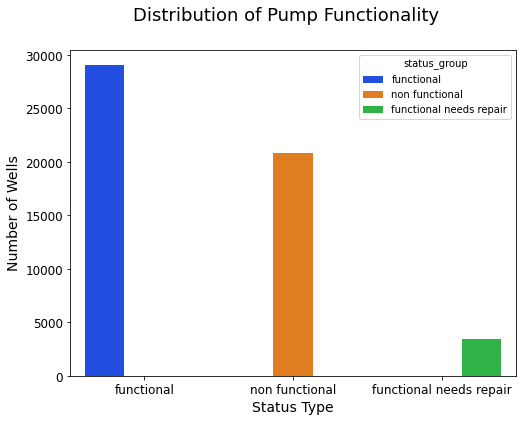

In [119]:
fig, ax = plt.subplots(figsize=(8,6))
ax = sns.countplot(x='status_group', hue="status_group", palette='bright', data=df)

fig.suptitle('Distribution of Pump Functionality', fontsize=18)
plt.xlabel("Status Type", fontsize=14)
plt.ylabel("Number of Wells", fontsize=14)
plt.tick_params(labelsize='large')
plt.show()

fig.savefig('/Users/karaoglan/Desktop.jpeg');

In [120]:
df['status_group'].value_counts()




functional                 29026
non functional             20829
functional needs repair     3454
Name: status_group, dtype: int64

We have the most functional wells at ~29,000, followed by non functional wells at ~21,000, and the minority class, functional needs repair at ~3,500.

## Construction year


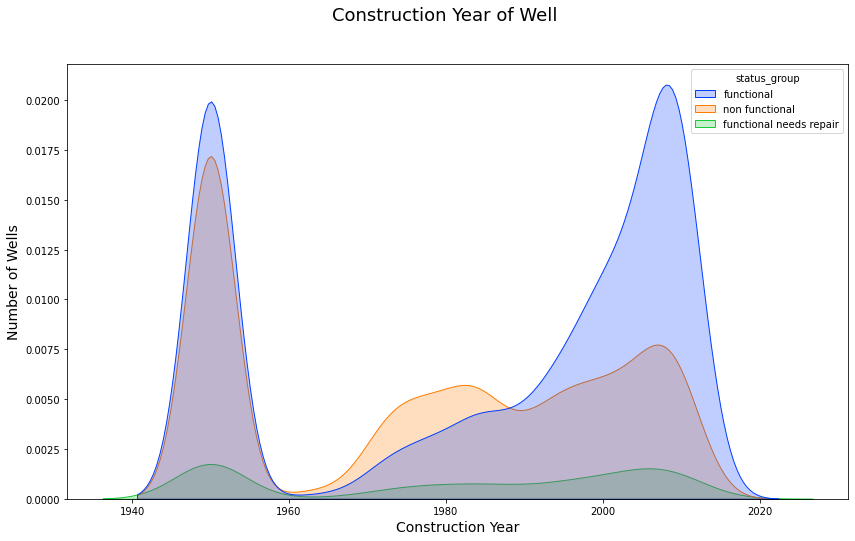

In [121]:
fig, ax = plt.subplots(figsize=(14,8))
ax = sns.kdeplot(data=df, x='construction_year', hue='status_group', palette='bright', fill=True)
fig.suptitle('Construction Year of Well', fontsize=18)
plt.xlabel("Construction Year", fontsize=14)
plt.ylabel("Number of Wells", fontsize=14)
plt.show();


There is large amount of data in the year 1950 which were entered as 0 in the dataset, these may be natural sources and our distribution is normal for these sources. However, we can see the correlation of an older pump being more likely to be non functional and more functional newer pumps.

In [122]:
# Create df without entries in year 1950
const_year_df = df.loc[df['construction_year'] != 1950]

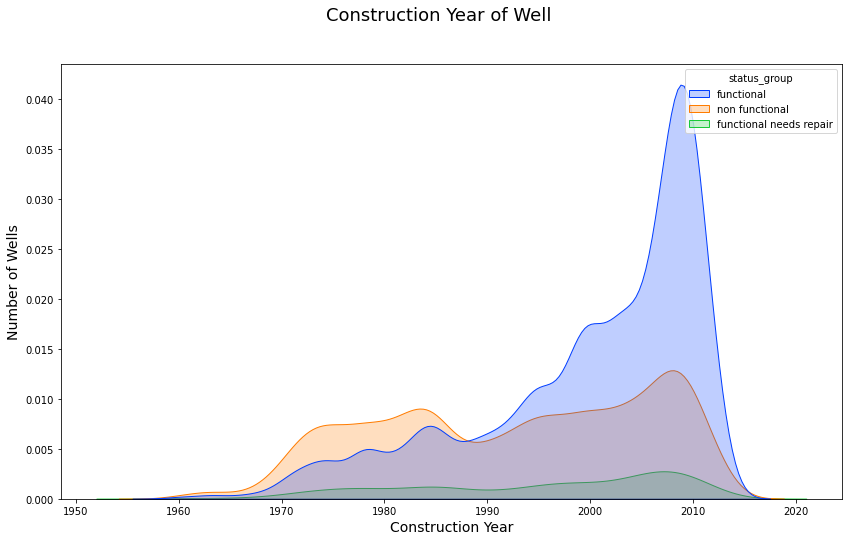

In [123]:
# Save without waterpoints from year 1950
fig, ax = plt.subplots(figsize=(14,8))
ax = sns.kdeplot(data=const_year_df, x='construction_year', hue='status_group', palette='bright', fill=True)
fig.suptitle('Construction Year of Well', fontsize=18)
plt.xlabel("Construction Year", fontsize=14)
plt.ylabel("Number of Wells", fontsize=14)
plt.show()

fig.savefig('/Users/karaoglan/Desktop.jpeg');

There are more non functional pumps than functional if they were built before 1988, but the rate of functionality keeps increasing after 1988.

### Population


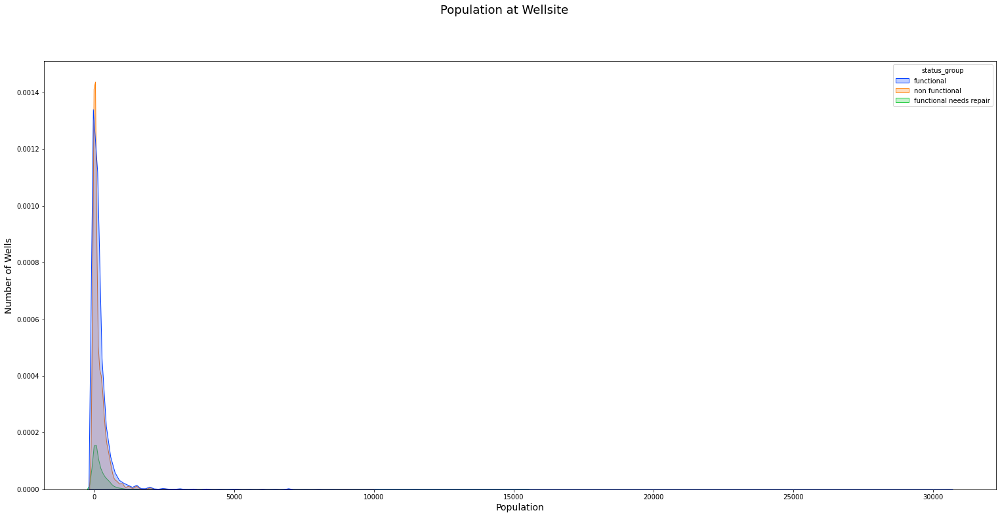

In [124]:
fig, ax = plt.subplots(figsize=(26,12))
ax = sns.kdeplot(data=df, x='population', hue='status_group', palette='bright', fill=True)
fig.suptitle('Population at Wellsite', fontsize=18)
plt.xlabel("Population", fontsize=14)
plt.ylabel("Number of Wells", fontsize=14)
plt.show()

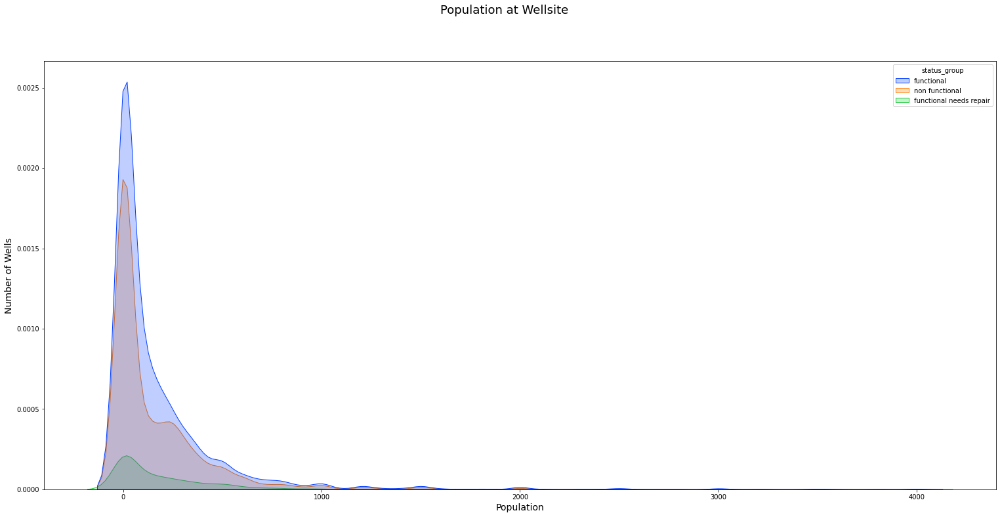

In [125]:
# Get a closer look
pop_df = df.loc[df['population'] <= 4000]

fig, ax = plt.subplots(figsize=(26,12))
ax = sns.kdeplot(data=pop_df, x='population', hue='status_group', palette='bright', fill=True)
fig.suptitle('Population at Wellsite', fontsize=18)
plt.xlabel("Population", fontsize=14)
plt.ylabel("Number of Wells", fontsize=14)
plt.show()


In [126]:
#df.sort_values[by= "functional", axis=0)

Overall, the distribution of pump functionality is similar across all population ranges and there isn't a lot of separation, with there being more functional wells than any other class. There isn't too much to draw from these graphs about population and functionality.

### Extraction_type_class


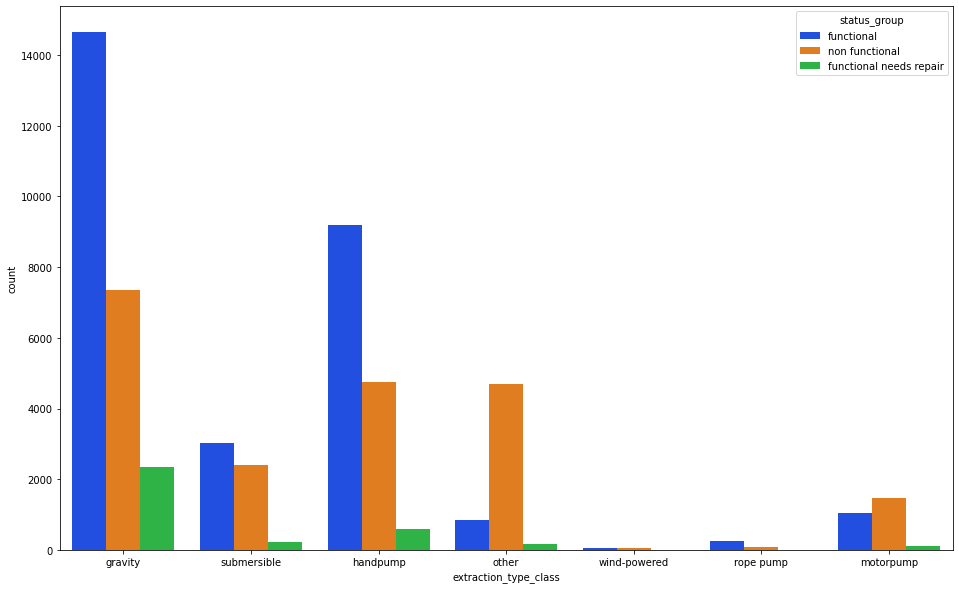

In [127]:
plt.figure(figsize=(16,10))
ax = sns.countplot(x='extraction_type_class', hue='status_group', palette='bright', data=df);

 Other type and motorpump are especially non functioning. Gravity and handpump are the 2 largest types, and both have more functioning, but half non functioning.

## Management

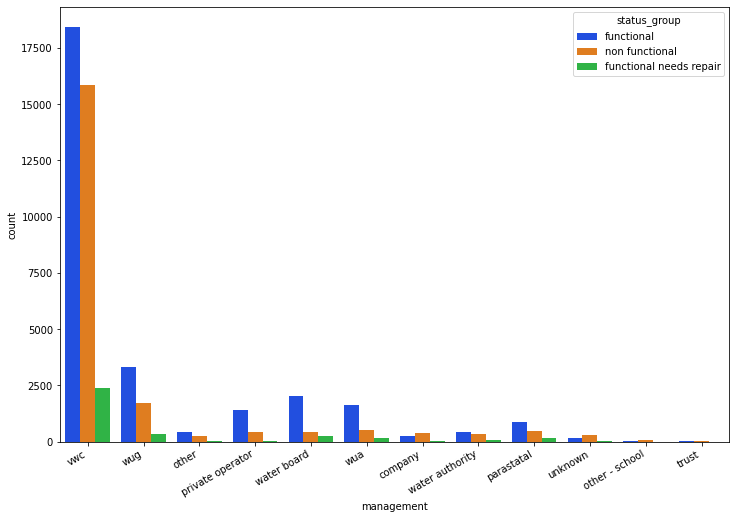

In [128]:
plt.figure(figsize=(12,8))
ax = sns.countplot(x='management', hue='status_group', palette='bright', data=df)
plt.xticks(rotation=30, ha='right');

water board, wua, and private operators have a high rate of functionality.



## Payment_type


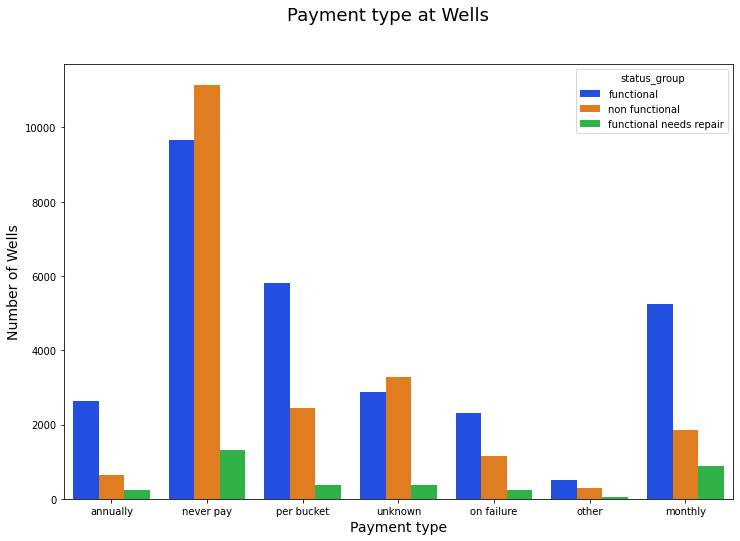

In [129]:
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.countplot(x='payment_type', hue="status_group", palette='bright', data=df)

fig.suptitle('Payment type at Wells', fontsize=18)
plt.xlabel("Payment type", fontsize=14)
plt.ylabel("Number of Wells", fontsize=14)
plt.show()

fig.savefig('/Users/karaoglan/Desktop.jpeg');

Never pay pumps have more non functioning waterpoints than functioning waterpoints. Some form of payment increases the functionality of the waterpoints.

## Water quality


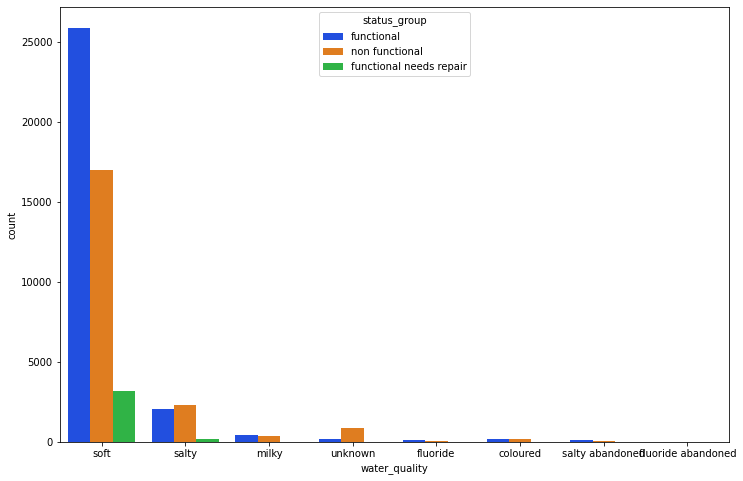

In [130]:
plt.figure(figsize=(12,8))
ax = sns.countplot(x='water_quality', hue='status_group', palette='bright', data=df);

Soft water quality has a high rate of functional waterpoints, salty has a high rate of non functional waterpoints.



## Source type


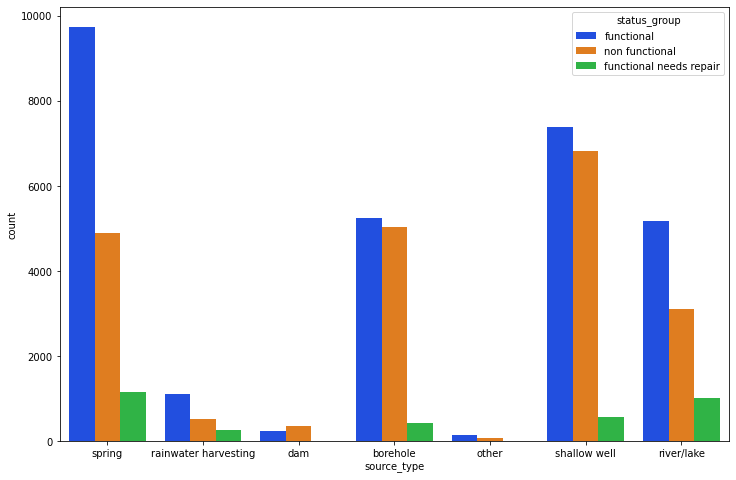

In [131]:
plt.figure(figsize=(12,8))
ax = sns.countplot(x='source_type', hue='status_group', palette='bright', data=df);

Even distribution of functional and nonfunctional boreholes. Many more functional springs and rivers than non functional.



# Basin

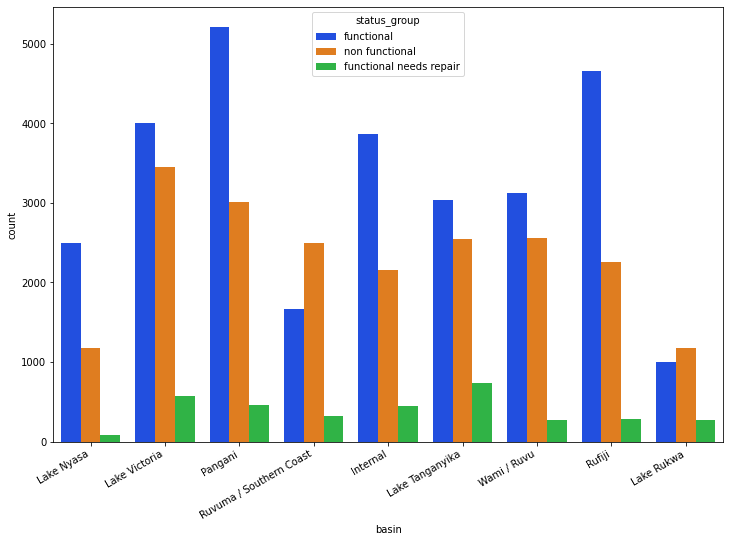

In [132]:

plt.figure(figsize=(12,8))
ax = sns.countplot(x='basin', hue='status_group', palette='bright', data=df)
plt.xticks(rotation=30, ha='right');

The Ruvuma/Southern Coast and Lake Rukwa basins have more non functioning wells than functional.



## Quantity


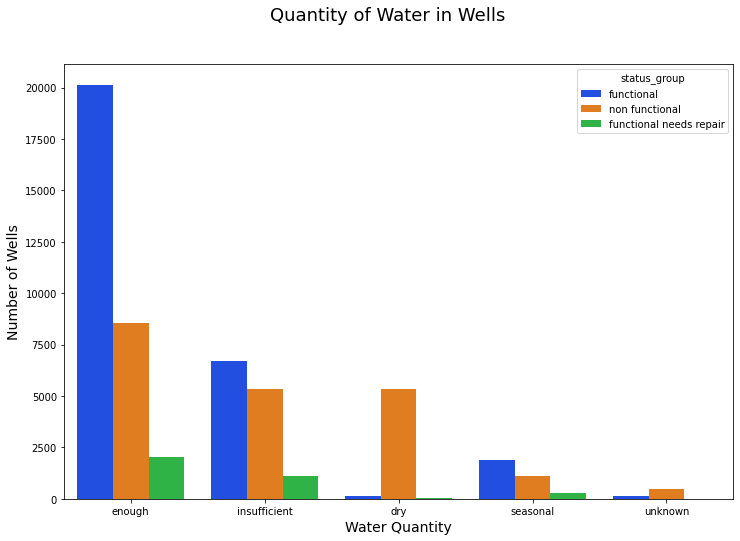

In [133]:

fig, ax = plt.subplots(figsize=(12,8))
ax = sns.countplot(x='quantity', hue="status_group", palette='bright', data=df)

fig.suptitle('Quantity of Water in Wells', fontsize=18)
plt.xlabel("Water Quantity", fontsize=14)
plt.ylabel("Number of Wells", fontsize=14)
plt.show()

fig.savefig('/Users/karaoglan/Desktop.jpeg');

Dry waterpoints have a high chance of being non functional, as expected. If the waterpoint has enough water, there is a high chance of functionality.

# Region

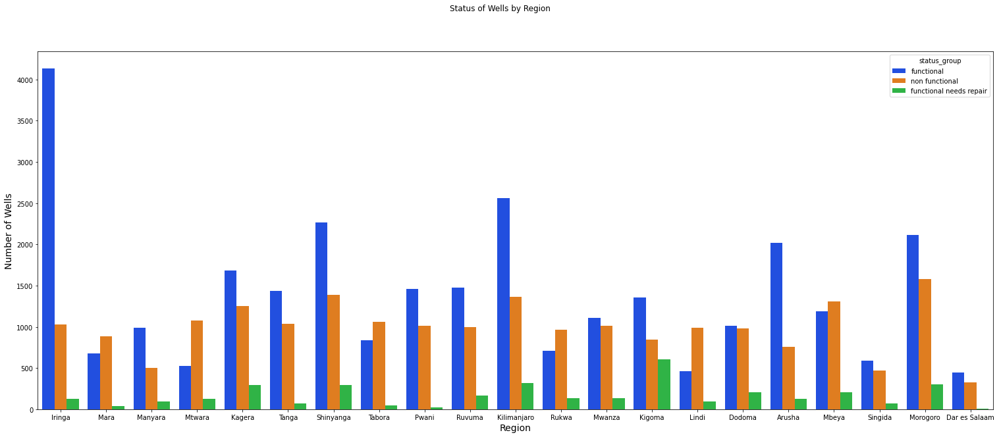

In [134]:
fig, ax = plt.subplots(figsize=(26,10))
ax = sns.countplot(x='region', hue="status_group", palette='bright', data=df)

fig.suptitle('Status of Wells by Region')
plt.xlabel("Region", fontsize=14)
plt.ylabel("Number of Wells", fontsize=14)
plt.show()

fig.savefig('/Users/karaoglan/Desktop.jpeg');


The Iringa region has a very high rate of functioning wells, followed by Kilimanjaro, Arusha, and Shinyanga. The worst regions for well perfomance are Mtwara, Mara, Rukwa, and Lindi.

## Waterpoint type


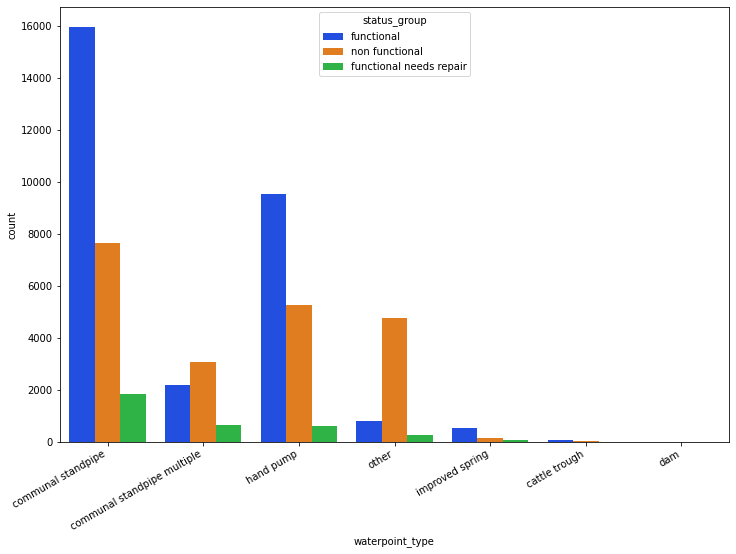

In [135]:
plt.figure(figsize=(12,8))
ax = sns.countplot(x='waterpoint_type', hue='status_group', palette='bright', data=df)
plt.xticks(rotation=30, ha='right');


other and commuanal standpipe multiple have the highest rate of being non functioning

### Installer


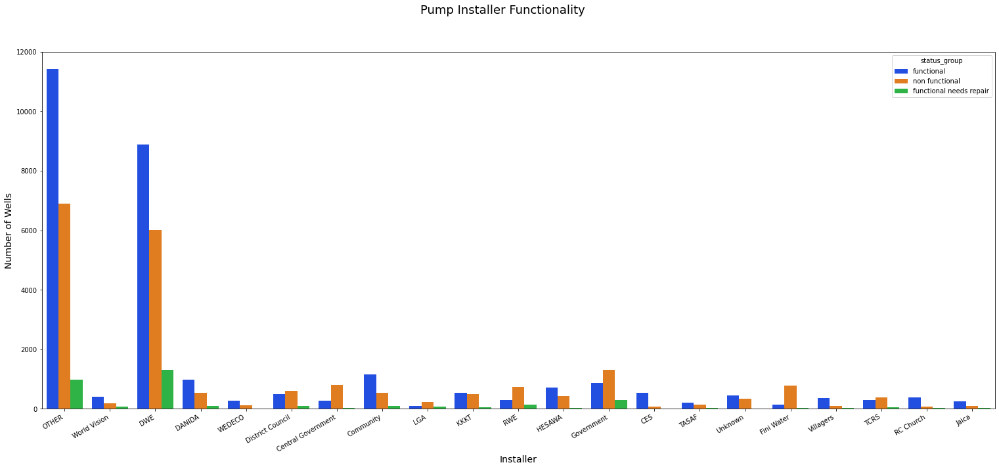

In [136]:
fig, ax = plt.subplots(figsize=(26,10))
ax = sns.countplot(x='installer', hue="status_group", palette='bright', data=df)

fig.suptitle('Pump Installer Functionality', fontsize=18)
plt.xlabel("Installer", fontsize=14)
plt.ylabel("Number of Wells", fontsize=14)
plt.xticks(rotation=30, ha='right')
plt.show()

fig.savefig('/Users/karaoglan/Desktop.jpeg');

The government, Fini Water, RWE, and Distict Council have a high rate of non functioning wells. Other is out largest category.



### Well Function map


In [137]:
import folium
from folium.plugins import FloatImage


In [138]:
# Create 3 dataframes for each status_group
df_f = df[df['status_group'] == 'functional']
df_nf = df[df['status_group'] == 'non functional']
df_fnr = df[df['status_group'] == 'functional needs repair']

In [139]:
# Create lists of latitude and longitude values
lat_f = [x for x in df_f['latitude']]
long_f = [x for x in df_f['longitude']]

lat_nf = [x for x in df_nf['latitude']]
long_nf = [x for x in df_nf['longitude']]

lat_fnr = [x for x in df_fnr['latitude']]
long_fnr = [x for x in df_fnr['longitude']]

lat_long_f = [(lat_f[i], long_f[i]) for i in range(len(lat_f))]
lat_long_nf = [(lat_nf[i], long_nf[i]) for i in range(len(lat_nf))]
lat_long_fnr = [(lat_fnr[i], long_fnr[i]) for i in range(len(lat_fnr))]

In [140]:
#Create map
this_map = folium.Map()

# Loop through 3 dataframes and plot point for each coordinate
for coord in lat_long_nf[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='orange', radius=1).add_to(this_map)
for coord in lat_long_f[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='blue', radius=1).add_to(this_map)
for coord in lat_long_fnr[::5]:
    folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='green', radius=1).add_to(this_map) 



#Set the zoom to fit our bounds
this_map.fit_bounds(this_map.get_bounds())

# Add legend
FloatImage('/Users/karaoglan/Desktoplegend.png', bottom=10, left=10).add_to(this_map)


this_map

As we saw above, there is a high rate of non functional waterpoints in the southeast corner of Tanzania in Mtwara and Lindi, as well as up north in Mara, and the southwest in Rukwa. We can see the cluster of high functional wells in Iringa, Shinyanga, Kilimanjaro, and Arusha. There is a cluster of functional but need repair waterpoints in Kigoma.



## Create df['status'] with status_group in integer format


In [141]:
# Change status_group/target values to numeric values
df['status'] = df.status_group.map({"non functional":0, "functional needs repair":1, "functional":1})
df.head()


,status_group,amount_tsh,gps_height,installer,longitude,latitude,basin,region,population,permit,construction_year,extraction_type_class,management,payment_type,water_quality,quantity,source_type,waterpoint_type,status
0,functional,6000.0,1390,OTHER,34.938093,-9.856322,Lake Nyasa,Iringa,109,0,1999,gravity,vwc,annually,soft,enough,spring,communal standpipe,1
1,functional,0.0,1399,OTHER,34.698766,-2.147466,Lake Victoria,Mara,280,1,2010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,1
2,functional,25.0,686,World Vision,37.460664,-3.821329,Pangani,Manyara,250,1,2009,gravity,vwc,per bucket,soft,enough,dam,communal standpipe multiple,1
3,non functional,0.0,263,OTHER,38.486161,-11.155298,Ruvuma / Southern Coast,Mtwara,58,1,1986,submersible,vwc,never pay,soft,dry,borehole,communal standpipe multiple,0
4,functional,0.0,0,OTHER,31.130847,-1.825359,Lake Victoria,Kagera,0,1,1950,gravity,other,never pay,soft,seasonal,rainwater harvesting,communal standpipe,1


In [142]:
df = df.drop('status_group', axis=1)


In [143]:
df.shape



(53309, 18)

# Modeling
### Data Preprocessing
Following we will create our dummy variables for our categorical columns and perform train test split to prepare for modeling.



In [144]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 53309 entries, 0 to 59399
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             53309 non-null  float64
 1   gps_height             53309 non-null  int64  
 2   installer              53309 non-null  object 
 3   longitude              53309 non-null  float64
 4   latitude               53309 non-null  float64
 5   basin                  53309 non-null  object 
 6   region                 53309 non-null  object 
 7   population             53309 non-null  int64  
 8   permit                 53309 non-null  int64  
 9   construction_year      53309 non-null  int64  
 10  extraction_type_class  53309 non-null  object 
 11  management             53309 non-null  object 
 12  payment_type           53309 non-null  object 
 13  water_quality          53309 non-null  object 
 14  quantity               53309 non-null  object 
 15  so

## One hot encoding


In [145]:
from sklearn.preprocessing import OneHotEncoder

In [146]:
# Create lists of categorical and continuous columns
cat_col = ['installer','basin','region','extraction_type_class','management','payment_type','water_quality',
           'quantity','source_type','waterpoint_type']
cont_col = ['amount_tsh','gps_height','longitude','latitude','population','permit','construction_year','status']

In [147]:
data = df.dropna(axis=0).reset_index(drop=True)

In [148]:
df_cont = data[cont_col]
df_cat = data[cat_col]

In [149]:
c = 0
for column in cat_col:
    print(column,"-->",len(data[column].unique()))
    c+= len(data[column].unique())

installer --> 21
basin --> 9
region --> 21
extraction_type_class --> 7
management --> 12
payment_type --> 7
water_quality --> 8
quantity --> 5
source_type --> 7
waterpoint_type --> 7


In [150]:
enc = OneHotEncoder()
X_cat = enc.fit_transform(df_cat).toarray()

In [151]:
X_cat = pd.DataFrame(X_cat, columns = enc.get_feature_names_out(cat_col))

In [152]:
# 53309
X_cat = X_cat.reset_index(drop=True)
df_cont = df_cont.reset_index(drop=True)

In [153]:
data_onehot = pd.concat([df_cont,X_cat], axis=1, ignore_index=True)

In [154]:
data_onehot.columns =list(df_cont.columns) + list(X_cat.columns)

In [155]:
# one_hot_encoded_data = pd.get_dummies(df, columns = ['installer','basin','region','extraction_type_class','management','payment_type','water_quality',
#            'quantity','source_type','waterpoint_type']).head()
# print(one_hot_encoded_data.shape)

### Separate target and perform train test split


In [156]:

y = data_onehot['status']
X = data_onehot.drop(['status'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=55)



### Model Statistics Function
Precision will be our main metric used to track model performance, but we will calculate accuracy, recall, and f1 score to provide more detail using sklearn's _classificationreport() function.

In [157]:
# function to track model metrics and plot confusion matrix

def model_score(model, X, y_pred, y_true):
#     target_names= ['non func', 'func need repair', 'functional']
    target_names= ['non func', 'functional']
    
    print(classification_report(y_true, y_pred, target_names=target_names))
    
    #Confusion matrix    
    return plot_confusion_matrix(model, X, y_true, display_labels=target_names);




### Logistic Regression


Test data model score:
              precision    recall  f1-score   support

    non func       0.81      0.62      0.70     16699
  functional       0.79      0.91      0.84     25948

    accuracy                           0.80     42647
   macro avg       0.80      0.76      0.77     42647
weighted avg       0.80      0.80      0.79     42647

              precision    recall  f1-score   support

    non func       0.81      0.62      0.71      4130
  functional       0.79      0.91      0.85      6532

    accuracy                           0.80     10662
   macro avg       0.80      0.77      0.78     10662
weighted avg       0.80      0.80      0.79     10662



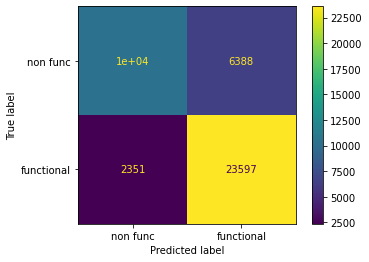

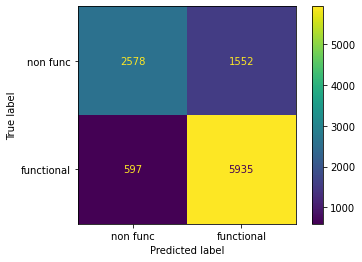

In [158]:
# Make pipe
pipe_lr = Pipeline([('ss', StandardScaler()), 
                    ('lr', LogisticRegression())])
#pipe_lr = Pipeline([
                    #('lr', LogisticRegression())])

# Fit and predict
pipe_lr.fit(X_train, y_train)
train_preds = pipe_lr.predict(X_train)
test_preds = pipe_lr.predict(X_test)


print("Test data model score:")

# test_preds
lr_score = model_score(pipe_lr, X_train, train_preds, y_train)
lr_score = model_score(pipe_lr, X_test, test_preds, y_test)


Our logistic regression model is improved to 75% accuracy over the dummy model. This model struggled to predict wells that were functional but needed repairs, likely due to class imbalances. The precision of the functional class is 73%.

### K Nearest Neighbors
Below I will run GridSearch with my Pipeline to create a K Nearest Neighbors model. I ran GridSearch to find the best parameters, and have then commented out the code to save computing time while still showing the process. The same process is repeated for all following models of running GridSearch and commenting out code.

In [159]:
# GridSearch 
knn = KNeighborsClassifier()
grid = {
    'n_neighbors' : [5, 10, 15, 20, 25, 40]
}

knn_grid_search = GridSearchCV(knn, grid, cv=5)
knn_grid_search.fit(X_train, y_train)

knn_grid_search.best_params_

{'n_neighbors': 15}

In [160]:
# Narrow down parameters for 2nd gridsearch
knn = KNeighborsClassifier()
grid = {
    
    'n_neighbors' : [ 11, 12, 13, 14, 15, 16, 17, 18]
}

knn_grid_search = GridSearchCV(knn, grid, cv=5)
knn_grid_search.fit(X_train, y_train)

knn_grid_search.best_params_



{'n_neighbors': 11}

Test data model score:
              precision    recall  f1-score   support

    non func       0.83      0.70      0.76     16699
  functional       0.82      0.91      0.87     25948

    accuracy                           0.83     42647
   macro avg       0.83      0.80      0.81     42647
weighted avg       0.83      0.83      0.82     42647

              precision    recall  f1-score   support

    non func       0.80      0.68      0.73      4130
  functional       0.81      0.89      0.85      6532

    accuracy                           0.81     10662
   macro avg       0.81      0.79      0.79     10662
weighted avg       0.81      0.81      0.81     10662



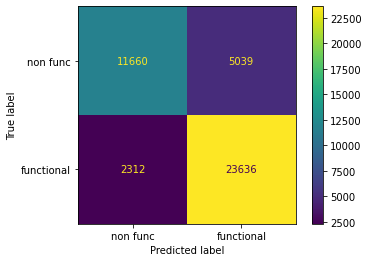

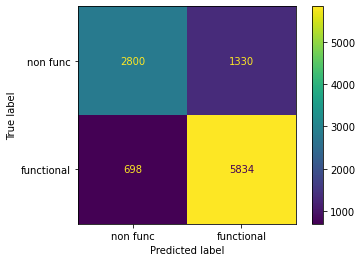

In [161]:
# Make pipe
pipe_knn = Pipeline([('ss', StandardScaler()), 
                    ('knn', KNeighborsClassifier(n_neighbors=17))])
#Fit and predict
pipe_knn.fit(X_train, y_train)
train_preds = pipe_knn.predict(X_train)
test_preds = pipe_knn.predict(X_test)

print("Test data model score:")
knn_score = model_score(pipe_knn, X_train, train_preds, y_train)

knn_score = model_score(pipe_knn, X_test, test_preds, y_test)



The K Nearest Neighbors model outperformed the Logistic Regression model. Number of neighbors was hypertuned by running and GridSearch and optimal parameters were put into our pipe. Our K Nearest Neighbors model is not overfitting as the accuracy of training and test sets are 80.23% and 76.03%, respectively. The precision of the functional class is 77%, which is a huge improvement from our Logistic Regression model at 73%.

## Decision Tree Model


In [162]:
# GridSearch commented out to show process
# dt = DecisionTreeClassifier()
# dt_grid = {
#     'criterion' : ['entropy', 'gini'],
#     'max_depth': [10, 20, 30, 40, 50, 60, None],
#     'min_samples_split' : [1, 2, 5, 10, 20, 30],
#     'min_impurity_decrease' : [0.0, 0.1, 0.2, 0.3, 0.4, 0.5],
# #     'min_impurity_split' : [None, 0.1, 0.2, 0.3, 0.4, 0.5],
# }

# dt_tree = GridSearchCV(estimator=dt, param_grid=dt_grid, cv=5)
# dt_tree.fit(X_train, y_train)


# print(f'Best parameters are {dt_tree.best_params_}')
# print(f'Best score {dt_tree.best_score_}')  #0.768565112
# print(f'Best estimator score {dt_tree.best_estimator_.score(X_test, y_test)}')  #0.779309697

# "Best parameters are 'criterion': 'gini', 'max_depth': 30, 'min_impurity_decrease': 0.0,\ 
#     'min_samples_split': 30", "Best score 0.8136796698169422,Best estimator score 0.8239542299756143")


Test data model score:
              precision    recall  f1-score   support

    non func       0.88      0.84      0.86     16699
  functional       0.90      0.92      0.91     25948

    accuracy                           0.89     42647
   macro avg       0.89      0.88      0.88     42647
weighted avg       0.89      0.89      0.89     42647

              precision    recall  f1-score   support

    non func       0.77      0.76      0.77      4130
  functional       0.85      0.86      0.86      6532

    accuracy                           0.82     10662
   macro avg       0.81      0.81      0.81     10662
weighted avg       0.82      0.82      0.82     10662



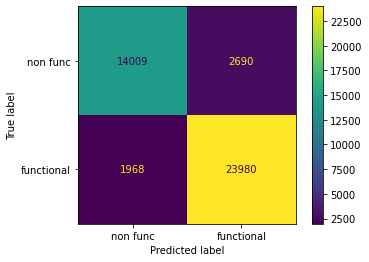

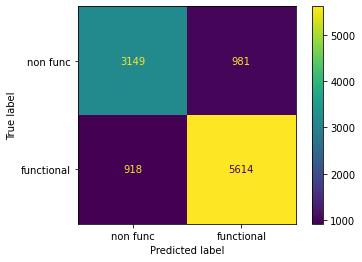

In [163]:
# Make pipe
pipe_dt = Pipeline([('ss', StandardScaler()), 
                    ('dt', DecisionTreeClassifier(criterion='gini', max_depth=30, min_impurity_decrease=0.0, 
                                                  min_samples_split=30))])
#Fit and Predict
pipe_dt.fit(X_train, y_train)
test_preds = pipe_dt.predict(X_test)
train_preds = pipe_dt.predict(X_train)

print("Test data model score:")
dt_score = model_score(pipe_dt, X_train, train_preds, y_train)
dt_score = model_score(pipe_dt, X_test, test_preds, y_test)


<!-- decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train, y_train) -->

### Function to plot feature importances


In [164]:
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    plt.figure(figsize=(10,25))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X_train.columns.values) 
    plt.xlabel('Feature importance')
    plt.ylabel('Feature')

### Decision Tree Feature Importances


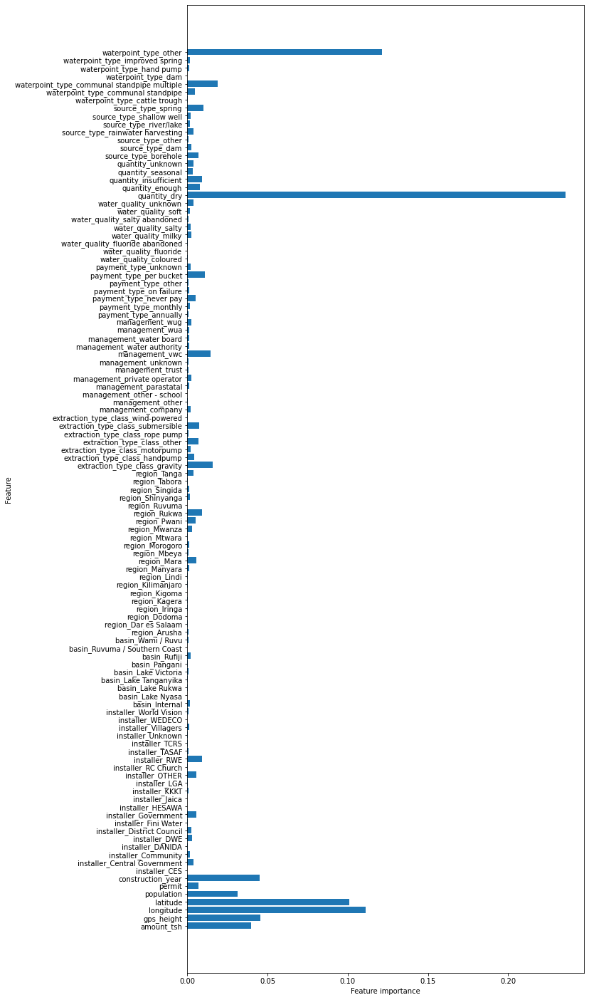

In [165]:
# Instantiate and fit a DecisionTreeClassifier with optimal parameters
tree_clf = DecisionTreeClassifier(criterion='gini', max_depth=30, min_impurity_decrease=0.0, min_samples_split=30) 
tree_clf.fit(X_train, y_train)

plot_feature_importances(tree_clf)

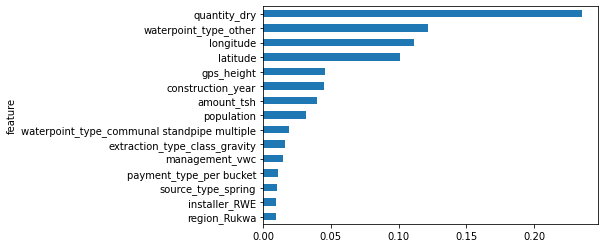

In [166]:
# Top features
feature_importances=pd.DataFrame(columns=['feature','importance'])

feature_importances['feature']= X_train.columns

feature_importances['importance']=tree_clf.feature_importances_

feature_importances= feature_importances.set_index('feature')

feature_importances['importance'].sort_values(ascending = True).tail(15).plot(kind='barh');

Our Decision Tree Feature Importances  model shows the most important features to be 
- quanity_dry
- waterpoint_type_other
- longitude
- latitude


### Random Forests


In [167]:
#Instantiate RandomForestClassifier
forest = RandomForestClassifier(n_estimators=100, max_depth= 5)
forest.fit(X_train, y_train)

#scores on folds
scores = cross_val_score(estimator=forest, X=X_train, y=y_train, cv=5)
print(np.mean(scores))

#scores on on test
score = forest.score(X_test, y_test)
print(score)

0.7709568856657179
0.7778090414556369


Test data model score:
              precision    recall  f1-score   support

    non func       0.88      0.84      0.86     16699
  functional       0.90      0.92      0.91     25948

    accuracy                           0.89     42647
   macro avg       0.89      0.88      0.88     42647
weighted avg       0.89      0.89      0.89     42647

              precision    recall  f1-score   support

    non func       0.86      0.78      0.82      4130
  functional       0.87      0.92      0.89      6532

    accuracy                           0.87     10662
   macro avg       0.86      0.85      0.86     10662
weighted avg       0.87      0.87      0.86     10662



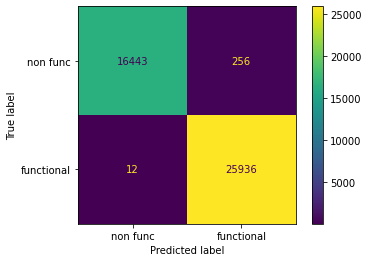

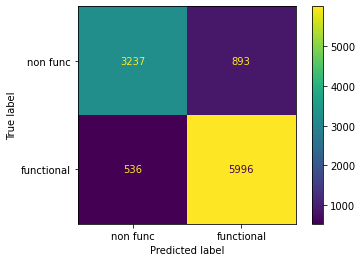

In [168]:
# Make pipeline with tuned hyperparameters
pipe_rf = Pipeline([('ss', StandardScaler()), 
                    ('RF', RandomForestClassifier(bootstrap=True, criterion='entropy', max_depth=30, min_impurity_decrease=0.0))])
# Fit and predict
pipe_rf.fit(X_train, y_train)

pipe_rf.fit(X_train, y_train)
test_preds = pipe_rf.predict(X_test)

# Print metrics
print("Test data model score:")
rf_score = model_score(pipe_rf, X_train, train_preds, y_train)
rf_score = model_score(pipe_rf, X_test, test_preds, y_test)

In [ ]:
rf_param_grid = {
    'n_estimators': [10, 30, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 2, 6, 10],
    'min_samples_split': [5, 10],
    'min_samples_leaf': [3, 6]
}

In [ ]:
# rf_grid_search = GridSearchCV(rf_clf, rf_param_grid, cv=5)
# rf_grid_search.fit(X_train, y_train)

# print(f"Training Accuracy: {rf_grid_search.best_score_ :.2%}")
# print("")
# print(f"Optimal Parameters: {rf_grid_search.best_params_}")
# Training Accuracy: 84.48%

# Optimal Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 5, 'n_estimators': 100}

Test data model score:
              precision    recall  f1-score   support

    non func       0.88      0.84      0.86     16699
  functional       0.90      0.92      0.91     25948

    accuracy                           0.89     42647
   macro avg       0.89      0.88      0.88     42647
weighted avg       0.89      0.89      0.89     42647

              precision    recall  f1-score   support

    non func       0.88      0.76      0.82      4130
  functional       0.86      0.94      0.90      6532

    accuracy                           0.87     10662
   macro avg       0.87      0.85      0.86     10662
weighted avg       0.87      0.87      0.86     10662



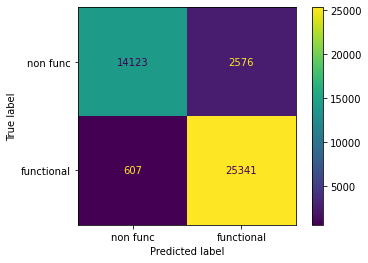

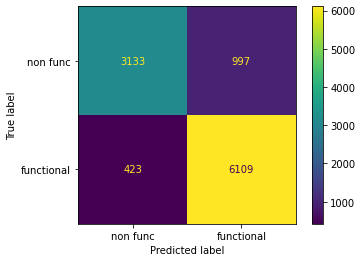

In [169]:
# Make pipeline with tuned hyperparameters
pipe_rf = Pipeline([('ss', StandardScaler()), 
                    ('RF', RandomForestClassifier(bootstrap=True, criterion='entropy', max_depth=50, 
                                                  min_samples_leaf= 2, min_samples_split= 3, n_estimators= 500))])
# Fit and predict
pipe_rf.fit(X_train, y_train)
test_preds = pipe_rf.predict(X_test)

# Print metrics
print("Test data model score:")
rf_score = model_score(pipe_rf, X_train, train_preds, y_train)

rf_score = model_score(pipe_rf, X_test, test_preds, y_test)



### Random Forests Feature Importances

In [ ]:
# Top features
feature_importances=pd.DataFrame(columns=['feature','importance'])

feature_importances['feature']= X_train.columns

feature_importances['importance']=forest.feature_importances_

feature_importances= feature_importances.set_index('feature')

feature_importances['importance'].sort_values(ascending = False).head(15).plot(kind='barh');

Our Random Forests  model shows the most important features to be 
- quanity_dr
- waterpoint_type_other
- extraction_type_class_other
- quantity_enough

In [ ]:
forest.feature_importances_



Our random forests model show waterpoint_type other, enough quantity, extraction_type_class_other, and amount_tsh being the most important features to the model.

### XG Boost


In [ ]:
# Instantiate XGBClassifier
xgb = XGBClassifier()

# Fit XGBClassifier
xgb.fit(X_train, y_train)

print("Test data model score:")
xgb_model_score = model_score(xgb, X_train, train_preds, y_train)
xgb_model_score = model_score(xgb, X_test, test_preds, y_test)



In [ ]:
# # #Gridsearch commented out
# xgb = XGBClassifier()
# grid = {
#     'learning_rate': [0.01,0.05,0.1],
#    'max_depth': [5,10,15],
#     'subsample': [0.5, 0.7,0.9],
#     'n_estimators': [100,500,1000]
    
#  }

# gs_xgb = GridSearchCV(estimator=xgb, param_grid=grid, cv=5)
# gs_xgb.fit(X_train, y_train)

# # print(f'Best parameters are {gs_xgb.best_params_}')
# # print(f'Best score {gs_xgb.best_score_}')  
# # print(f'Best estimator score {gs_xgb.best_estimator_.score(X_test, y_test)}')  

In [ ]:
 gs_xgb.best_params_
    {'learning_rate': 0.01,
  'max_depth': 10,
  'n_estimators': 1000,
  'subsample': 0.9}

Test data model score:
              precision    recall  f1-score   support

    non func       0.88      0.84      0.86     16699
  functional       0.90      0.92      0.91     25948

    accuracy                           0.89     42647
   macro avg       0.89      0.88      0.88     42647
weighted avg       0.89      0.89      0.89     42647

              precision    recall  f1-score   support

    non func       0.85      0.79      0.82      4130
  functional       0.87      0.91      0.89      6532

    accuracy                           0.86     10662
   macro avg       0.86      0.85      0.85     10662
weighted avg       0.86      0.86      0.86     10662



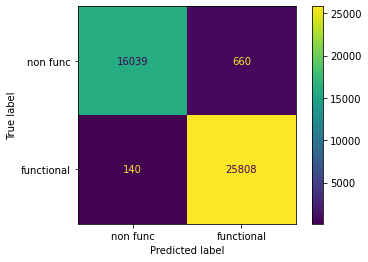

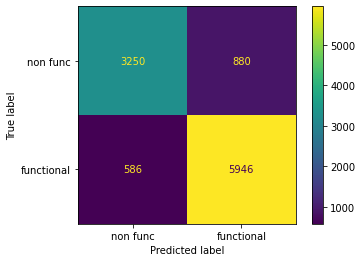

In [170]:
# Instantiate xg Boost Classifier pipeline with tuned hyperparameters
pipe_xgb = Pipeline([('ss', StandardScaler()), 
                     ('xgb', XGBClassifier(learning_rate=0.1, max_depth=10, min_child_weight=2,
                      n_estimators=1000, subsample=0.9))])

pipe_xgb.fit(X_train, y_train)
test_preds = pipe_xgb.predict(X_test)

print("Test data model score:")
dt_score = model_score(pipe_xgb, X_train, train_preds, y_train)
dt_score = model_score(pipe_xgb, X_test, test_preds, y_test)

In [ ]:
# # Predict on training and test sets
# training_preds = pipe_xgb.predict(X_train)
# test_preds = pipe_xgb.predict(X_test)

# # Accuracy of training and test sets
# training_accuracy = accuracy_score(y_train, training_preds)
# test_accuracy = accuracy_score(y_test, test_preds)

# print('Training Accuracy: {:.4}%'.format(training_accuracy * 100))
# print('Validation accuracy: {:.4}%'.format(test_accuracy * 100))



Our best performing model ended up being the XG Boost model with tuned hyperparameters, although the random forests model was not far behind with 80% precision for the functional wells class. The model has overfitted the training data with a training accuracy of 92.57% and test accuracy at 81.73%, but this model boasted the highest precision score for the functional wells class at 81%.

### XGB Feature Importances


In [ ]:
feature_importances=pd.DataFrame(columns=['feature','importance'])
feature_importances['feature']= X_train.columns
feature_importances['importance']=xgb.feature_importances_
feature_importances= feature_importances.set_index('feature')
feature_importances['importance'].sort_values(ascending = False).head(15).plot(kind='barh');

Our XG Boost model shows the most important features to be 
- quantity_dry, 

- waterpoint_type_class_other,
- extraction_type_class_other,
- managment_company

## Bussines Problem


- The Tanzanian goverment has a severe water crisis on their hands​

- They want to predict which pumps are functional, functional but need repairs, and non functional​

- Taarifa and Tanzanian Ministry of Water have shared the dataset to aid understanding of pump failure​

- I will build model to help the goverment improve maintenance operations​

- And ensure clean drinking waer is accessible to communities acrosstanzania​

## Recommendations

- Location
    - Target repairs in areas like Lindi and Mtwara that have a high rateof non functional wells
    - Make repairs to functional wells in Kignma to maximize cost effectivess
- Repairs
    - Prioritize non functional and functional wells which need repair and have enough water
- Payment
    - Payment provides incentive and means to keep ells functional
- Installers
    - Avoid using installers with a high rate of pump failure


## Conclusions


Random Forests was our top performing model, although XG Boost was not far behind. The poor performance of the Logistic Regression , KNN, and Decision Tree indicate that the data is not easily separable. Our Random Forests model performs with an 87% testing accuracy and precision for the functional class at 86%. 


Several of our models showed one of it's most important features to be quantity  for the waterpoint. There are over 8,000 waterpoints that have enough water in them but are non functional. These are a high priority to address as well since there is water present. Wells with no fees are more likely to be non functional. Payment provides incentive and means to keep wells functional. The Government, District Council, and Fini Water all have a high rate of pump failure. Investigate why these installers have such a high rate of failure or use other installers.



Decision Tree Feature Importances model shows the most important features to be 
- quantity_dry
- waterpoint_type_other
- longitude
- latitude

Our Random Forests  model shows the most important features to be 
- quantity_dr
- waterpoint_type_other
- extraction_type_class_other
- quantity_enough

Our XG Boost model shows the most important features to be 
- quantity_dry, 

- waterpoint_type_class_other,
- extraction_type_class_other,
- managment_company

## Future work 

Future work for this project involve improving the quality of the data moving forward. Better data trained in our model will improve the predictions. We will also monitor the wells and update the model regularly to continuously improve our strategy.